In [ ]:
using KomaMRI, MAT, Plots, LinearAlgebra, Measures, LaTeXStrings, Statistics, Distributions

sys = Scanner()
sim_params = KomaMRICore.default_sim_params()
sim_params["return_type"] = "mat"
sim_params["sim_method"] = BlochDict()
sim_params["gpu"] = false

seq = read_seq("C:/Users/lucya/MSC_PROJECT/Dictionary/sequences/mpf_001_PhantomStudy_short_124.seq")

┌ Info: Loading sequence mpf_001_PhantomStudy_short_124.seq ...
└ @ KomaMRIFiles C:\Users\lucya\.julia\packages\KomaMRIFiles\Xc9Fh\src\Sequence\Pulseq.jl:339


Sequence[ τ = 5117.377 ms | blocks: 2003 | ADC: 1000 | GR: 6001 | RF: 962 | DEF: 11 ]

In [2]:
T1_ms, T2_ms = 1612.1, 271
T1, T2 = T1_ms / 1000, T2_ms / 1000

(1.6120999999999999, 0.271)

In [3]:
# NORMAL 

x_pos = collect(range(-10e-3, 10e-3, length=10001))
obj = Phantom{Float64}(
    x = x_pos,
    y = zeros(length(x_pos)),
    z = zeros(length(x_pos)),
    T1 = fill(T1, length(x_pos)),
    T2 = fill(T2, length(x_pos)),
)

sig = simulate(obj, seq, sys; sim_params=sim_params)
sig_clean = dropdims(sig; dims=(3,4))

┌ Info: Simulation will be run on the CPU with only 1 thread. To enable multi-threading, start julia with --threads=auto
└ @ KomaMRICore C:\Users\lucya\.julia\packages\KomaMRICore\DEJdd\src\simulation\SimulatorCore.jl:335
┌ Info: Running simulation in the CPU with 1 thread(s)
│   koma_version = 0.9.1
│   sim_method = BlochDict(save_Mz=false)
│   spins = 10001
│   time_points = 42523
│   adc_points = 1000
└ @ KomaMRICore C:\Users\lucya\.julia\packages\KomaMRICore\DEJdd\src\simulation\SimulatorCore.jl:385
Running simulation...   0%|█                             |  ETA: 2:36:39


Running simulation...   4%|██                            |  ETA: 0:05:21


Running simulation...   4%|██                            |  ETA: 0:04:35


Running simulation...   5%|██                            |  ETA: 0:04:06


Running simulation...   5%|██                            |  ETA: 0:03:45


Running simulation...   6%|██                            |  ETA: 0:03:23


Running simulation...   6%|██            

 34.842587 seconds (21.81 M allocations: 26.416 GiB, 9.53% gc time, 32.33% compilation time: <1% of which was recompilation)


1000×10001 Matrix{ComplexF32}:
  -0.0155017-0.0162847im   …    0.0168161-0.0118396im
  0.00215006-0.0220987im       0.00193979-0.0201073im
   0.0182606-0.0131969im         -0.01411-0.01484im
   0.0226484+0.00433932im      -0.0210891+0.000245423im
   0.0129057+0.0191243im       -0.0148372+0.0152835im
 -0.00418414+0.0218539im   …  0.000123636+0.020708im
  -0.0174422+0.0112835im        0.0139226+0.0134642im
  -0.0185046-0.0053263im        0.0177516-0.00133343im
 -0.00712666-0.0171076im       0.00951819-0.0139169im
  0.00900717-0.016687im       -0.00511289-0.0163039im
            ⋮              ⋱             ⋮
  0.00180966+0.00290755im     -0.00180965+0.00290755im
  0.00184375+0.00284823im     -0.00184374+0.00284822im
  0.00187994+0.00283748im     -0.00187994+0.00283747im
  0.00187268+0.00286189im     -0.00187269+0.00286188im
  0.00181117+0.0028783im   …  -0.00181118+0.0028783im
  0.00172916+0.00284882im     -0.00172916+0.00284883im
  0.00164717+0.00277677im     -0.00164717+0.00277678im
  

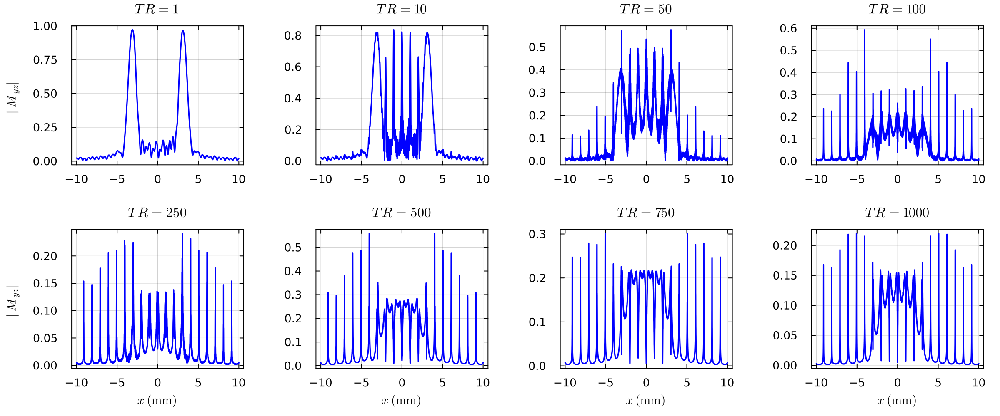

In [4]:
t_indices = [1, 10, 50, 100, 250, 500, 750, 1000]
x_pos_mm = x_pos .* 1000

plot_list = []

xlims = (-10, 10)
y_max = maximum([maximum(abs.(sig_clean[t, :])) for t in t_indices]) * 1.05
ylims = (0.0, y_max)

for (i, t_idx) in enumerate(t_indices)
    Mmag = abs.(sig_clean[t_idx, :])

    xlabel = i > 4 ? L"x\ \mathrm{(mm)}" : ""
    ylabel = (i-1) % 4 == 0 ? L"|M_{yz}|" : ""

    p = plot(
        x_pos_mm, Mmag,
        lw=1.6, color=:blue, label="",
        xlabel=xlabel, ylabel=ylabel,
        title=L"TR = %$t_idx", titlefont=11,
        tickfont=9, guidefont=10,
        framestyle=:box,
        left_margin=6mm, right_margin=3mm,
        bottom_margin=6mm, top_margin=3mm,
        dpi=200
    )
    push!(plot_list, p)
end

p_all = plot(
    plot_list...;
    layout=(2,4),
    size=(1200,500),
    margin=1mm 
)


In [5]:
# slice_thickness = 20e-3  
# inside_mask = abs.(x_pos) .<= (slice_thickness / 2)
# outside_mask = .!inside_mask

N_voxels = 10001

data_reshaped = Array{eltype(sig_clean)}(undef, 1000, 1, N_voxels)

for v in 1:N_voxels
    for s in 1:1
        idx = (s - 1) * N_voxels + v  
        data_reshaped[:, s, v] = sig_clean[:, idx]
    end
end

data_summed = sum(data_reshaped, dims=2)   
data_summed   = dropdims(data_summed; dims=2) 

1000×10001 Matrix{ComplexF32}:
  -0.0155017-0.0162847im   …    0.0168161-0.0118396im
  0.00215006-0.0220987im       0.00193979-0.0201073im
   0.0182606-0.0131969im         -0.01411-0.01484im
   0.0226484+0.00433932im      -0.0210891+0.000245423im
   0.0129057+0.0191243im       -0.0148372+0.0152835im
 -0.00418414+0.0218539im   …  0.000123636+0.020708im
  -0.0174422+0.0112835im        0.0139226+0.0134642im
  -0.0185046-0.0053263im        0.0177516-0.00133343im
 -0.00712666-0.0171076im       0.00951819-0.0139169im
  0.00900717-0.016687im       -0.00511289-0.0163039im
            ⋮              ⋱             ⋮
  0.00180966+0.00290755im     -0.00180965+0.00290755im
  0.00184375+0.00284823im     -0.00184374+0.00284822im
  0.00187994+0.00283748im     -0.00187994+0.00283747im
  0.00187268+0.00286189im     -0.00187269+0.00286188im
  0.00181117+0.0028783im   …  -0.00181118+0.0028783im
  0.00172916+0.00284882im     -0.00172916+0.00284883im
  0.00164717+0.00277677im     -0.00164717+0.00277678im
  

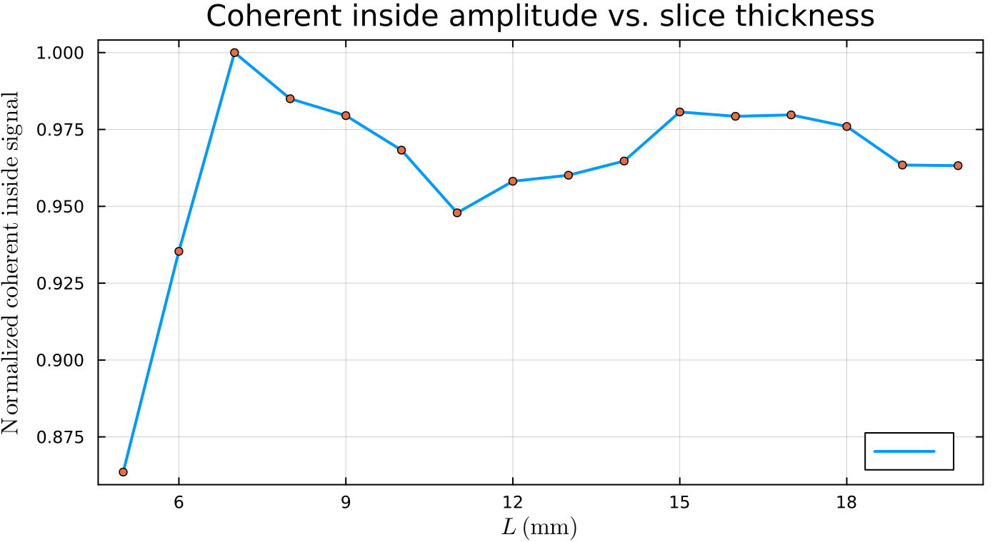

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [6]:
function mean_inside_signal(S::AbstractMatrix{<:Complex}, x::AbstractVector, L_m::Float64)
    @assert size(S,2) == length(x) "data_summed columns must match x_pos length"
    mask = abs.(x) .<= (L_m/2)
    @assert any(mask) "Inside mask empty; check L vs FOV"
    inside_per_t = @views [abs(sum(S[t, mask])) for t in 1:size(S,1)]
    return mean(inside_per_t)
end

Ls_mm = collect(5.0:1.0:20.0)
Ls_m  = Ls_mm .* 1e-3

avg_inside = [mean_inside_signal(data_summed, x_pos, L) for L in Ls_m]
avg_inside_norm = avg_inside ./ maximum(avg_inside)

default(dpi=200, framestyle=:box, size=(700,380))
p = plot(Ls_mm, avg_inside_norm, lw=2, label=L"\mathrm{mean}\ |\sum_{|x|\le L/2} M_{xy}(t,x)|\ \ (\mathrm{norm.})",
         xlabel=L"L\ \mathrm{(mm)}", ylabel=L"\mathrm{Normalized\ coherent\ inside\ signal}",
         title="Coherent inside amplitude vs. slice thickness")
scatter!(p, Ls_mm, avg_inside_norm, ms=3, label="")
display(p)

In [7]:
function gauss_legendre_cauchy(γ_hz::Float64; N::Int)
    βtail = 0.5 ./ sqrt.(1 .- (2 .* (1:N-1)) .^ (-2))
    T = SymTridiagonal(zeros(N), βtail)
    evals, evecs = eigen(T)
    û = evals
    ŵ = 2 .* (evecs[1, :]).^2
    f_hz = γ_hz .* tan.(0.5π .* û)
    Δω = 2π .* f_hz
    w_norm = 0.5 .* ŵ
    return Δω, w_norm
end

N_samples = 15
T2prime = 0.05
γ_hz = 1 / (2π * T2prime)
Δω_values, weights = gauss_legendre_cauchy(γ_hz; N=N_samples)

obj_t2star = Phantom{}()
for (Δω, w) in zip(Δω_values, weights)
    aux = Phantom{}(
        x = x_pos,
        y = zeros(length(x_pos)),
        z = zeros(length(x_pos)),
        T1 = fill(T1, length(x_pos)),
        T2 = fill(T2, length(x_pos)),
        Δw = fill(Δω, length(x_pos)),
        ρ  = fill(w, length(x_pos))
    )
    obj_t2star += aux
end

sig = simulate(obj_t2star, seq, sys; sim_params=sim_params)
sig_clean_off = dropdims(sig; dims=(3,4))
signal_weighted = vec(sum(sig_clean_off, dims=2))


┌ Info: Running simulation in the CPU with 1 thread(s)
│   koma_version = 0.9.1
│   sim_method = BlochDict(save_Mz=false)
│   spins = 150015
│   time_points = 42523
│   adc_points = 1000
└ @ KomaMRICore C:\Users\lucya\.julia\packages\KomaMRICore\DEJdd\src\simulation\SimulatorCore.jl:385
Running simulation...   0%|█                             |  ETA: 0:41:51


Running simulation...   0%|█                             |  ETA: 0:24:16


Running simulation...   0%|█                             |  ETA: 0:20:26


Running simulation...   0%|█                             |  ETA: 0:19:01


Running simulation...   0%|█                             |  ETA: 0:16:53


Running simulation...   0%|█                             |  ETA: 0:16:08


Running simulation...   0%|█                             |  ETA: 0:14:47


Running simulation...   1%|█                             |  ETA: 0:14:34


Running simulation...   1%|█                             |  ETA: 0:13:41


Running simulation...   1%|█         

518.491835 seconds (5.28 M allocations: 380.526 GiB, 7.17% gc time)


1000-element Vector{ComplexF32}:
     2.3583589f0 - 138.98535f0im
    0.23525599f0 - 150.132f0im
    0.08149731f0 - 196.21397f0im
    0.04919317f0 - 231.85773f0im
   0.044235323f0 - 238.96782f0im
    0.04538573f0 - 249.51093f0im
   0.051921163f0 - 251.83601f0im
   0.025332417f0 - 259.19553f0im
   -0.01781822f0 - 262.52792f0im
   -0.07049515f0 - 266.17142f0im
                 ⋮
 -0.0027096036f0 + 207.66913f0im
 -0.0026824926f0 + 204.8268f0im
  -0.002774307f0 + 203.50546f0im
 -0.0026374378f0 + 200.4733f0im
  -0.002626709f0 + 197.68121f0im
 -0.0025929403f0 + 196.4044f0im
 -0.0025638663f0 + 192.00255f0im
 -0.0025532832f0 + 191.02066f0im
 -0.0024136503f0 + 188.17001f0im

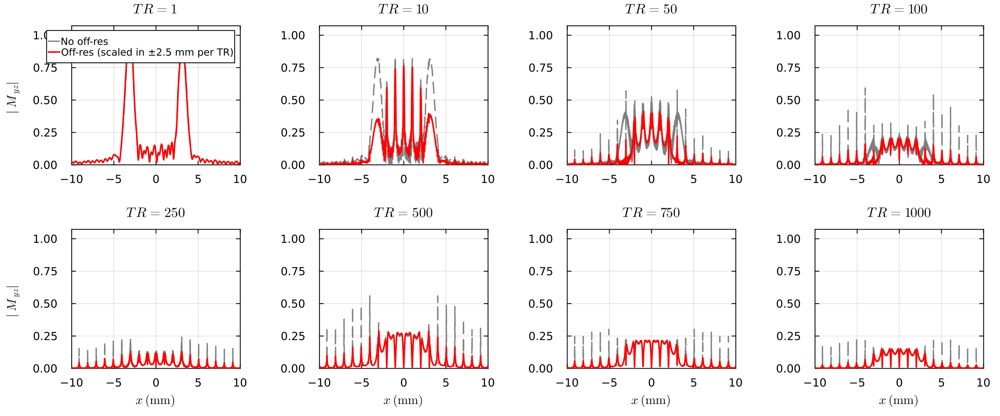

In [ ]:
Nx = length(x_pos_mm)
T_off, C_off = size(sig_clean_off)
K = C_off / Nx

sig_off = zeros(eltype(sig_clean_off), T_off, Nx)
for k in 1:K
    cols = ((k-1)*Nx + 1):(k*Nx)
    sig_off .+= sig_clean_off[:, cols]
end

sig_base = sig_clean

function scale_offres_to_baseline(sig_off::AbstractMatrix,
                                  sig_base::AbstractMatrix,
                                  x_mm::AbstractVector;
                                  window_mm::Real = 5.0,
                                  agg = mean)
    @assert size(sig_off) == size(sig_base)
    mask = abs.(x_mm) .<= (window_mm/2)
    T, _ = size(sig_off)

    s = ones(Float64, T)
    for t in 1:T
        a = agg(abs.(sig_base[t, mask]))
        b = agg(abs.(sig_off[t,  mask]))
    end

    sig_off_scaled = sig_off .* reshape(s, T, 1)
    return s, sig_off_scaled
end

scale_factors, sig_off_scaled = scale_offres_to_baseline(sig_off, sig_base, x_pos_mm; window_mm=5.0, agg=mean)

y_max = maximum(vcat([maximum(abs.(sig_base[t,:])) for t in t_indices],
                     [maximum(abs.(sig_off_scaled[t,:])) for t in t_indices])) * 1.05
xlims = (-10, 10)
ylims = (0.0, y_max)

plots = Plots.Plot[]
for (i, t) in enumerate(t_indices)
    xlabel = i > 4 ? L"x\ \mathrm{(mm)}" : ""
    ylabel = (i-1) % 4 == 0 ? L"|M_{yz}|" : ""

    p = plot(x_pos_mm, abs.(sig_base[t, :]);
             lw=1.6, label=(i==1 ? "No off-res" : ""), color=:grey, linestyle=:dash,
             xlims=xlims, ylims=ylims,
             xlabel=xlabel, ylabel=ylabel,
             title=L"TR = %$t", titlefont=11,
             tickfont=9, guidefont=10, framestyle=:box,
             left_margin=6mm, right_margin=3mm,
             bottom_margin=6mm, top_margin=3mm, dpi=200)

    plot!(p, x_pos_mm, abs.(sig_off_scaled[t, :]);
          lw=1.8, label=(i==1 ? "Off-res" : ""), color=:red)

    plot!(p, legend=(i==1) ? :topright : false)
    push!(plots, p)
end

plot(plots...; layout=(2,4), size=(1200,500), margin=1mm)
